## This Assignment consist of Random Forest Algorithm applied on various dataset

## Link to Dataset for the Assignment:
- Credit Risk Classification Dataset
[https://www.kaggle.com/datasets/praveengovi/credit-risk-classification-dataset/data]

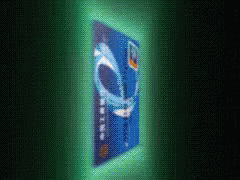

In [1]:
# Importing libraries 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import KNNImputer
import warnings
from sklearn.model_selection import train_test_split
warnings.filterwarnings('ignore')

In [2]:
# Loading the Credit Risk dataset
d1 = pd.read_csv('customer_data.csv')
d2 = pd.read_csv('payment_data.csv')

In [3]:
d1.head()

,label,id,fea_1,fea_2,fea_3,fea_4,fea_5,fea_6,fea_7,fea_8,fea_9,fea_10,fea_11
0,1,54982665,5,1245.5,3,77000.0,2,15,5,109,5,151300,244.948974
1,0,59004779,4,1277.0,1,113000.0,2,8,-1,100,3,341759,207.173840
2,0,58990862,7,1298.0,1,110000.0,2,11,-1,101,5,72001,1.000000
3,1,58995168,7,1335.5,1,151000.0,2,11,5,110,3,60084,1.000000
4,0,54987320,7,NaN,2,59000.0,2,11,5,108,4,450081,197.403141


In [4]:
d2.head()

,id,OVD_t1,OVD_t2,OVD_t3,OVD_sum,pay_normal,prod_code,prod_limit,update_date,new_balance,highest_balance,report_date
0,58987402,0,0,0,0,1,10,16500.0,04/12/2016,0.0,NaN,NaN
1,58995151,0,0,0,0,1,5,NaN,04/12/2016,588720.0,491100.0,NaN
2,58997200,0,0,0,0,2,5,NaN,04/12/2016,840000.0,700500.0,22/04/2016
3,54988608,0,0,0,0,3,10,37400.0,03/12/2016,8425.2,7520.0,25/04/2016
4,54987763,0,0,0,0,2,10,NaN,03/12/2016,15147.6,NaN,26/04/2016


In [5]:
#Cheaking the datasets
d1.info()
# it  seems that fea_2 has null values

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1125 entries, 0 to 1124
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   label   1125 non-null   int64  
 1   id      1125 non-null   int64  
 2   fea_1   1125 non-null   int64  
 3   fea_2   976 non-null    float64
 4   fea_3   1125 non-null   int64  
 5   fea_4   1125 non-null   float64
 6   fea_5   1125 non-null   int64  
 7   fea_6   1125 non-null   int64  
 8   fea_7   1125 non-null   int64  
 9   fea_8   1125 non-null   int64  
 10  fea_9   1125 non-null   int64  
 11  fea_10  1125 non-null   int64  
 12  fea_11  1125 non-null   float64
dtypes: float64(3), int64(10)
memory usage: 114.4 KB


In [6]:
d2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8250 entries, 0 to 8249
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               8250 non-null   int64  
 1   OVD_t1           8250 non-null   int64  
 2   OVD_t2           8250 non-null   int64  
 3   OVD_t3           8250 non-null   int64  
 4   OVD_sum          8250 non-null   int64  
 5   pay_normal       8250 non-null   int64  
 6   prod_code        8250 non-null   int64  
 7   prod_limit       2132 non-null   float64
 8   update_date      8224 non-null   object 
 9   new_balance      8250 non-null   float64
 10  highest_balance  7841 non-null   float64
 11  report_date      7136 non-null   object 
dtypes: float64(3), int64(7), object(2)
memory usage: 773.6+ KB


In [7]:
d1.isnull().sum()

label       0
id          0
fea_1       0
fea_2     149
fea_3       0
fea_4       0
fea_5       0
fea_6       0
fea_7       0
fea_8       0
fea_9       0
fea_10      0
fea_11      0
dtype: int64

In [8]:
d2.isnull().sum()

id                    0
OVD_t1                0
OVD_t2                0
OVD_t3                0
OVD_sum               0
pay_normal            0
prod_code             0
prod_limit         6118
update_date          26
new_balance           0
highest_balance     409
report_date        1114
dtype: int64

columns: label


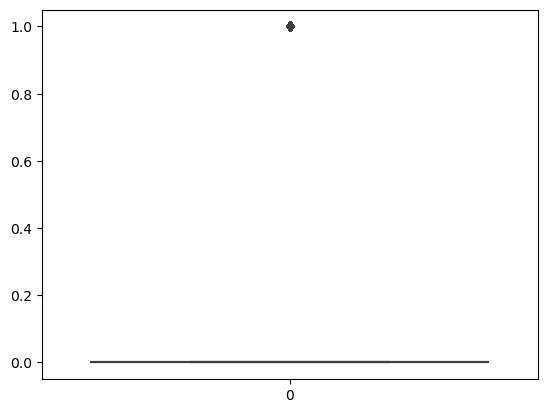

columns: id


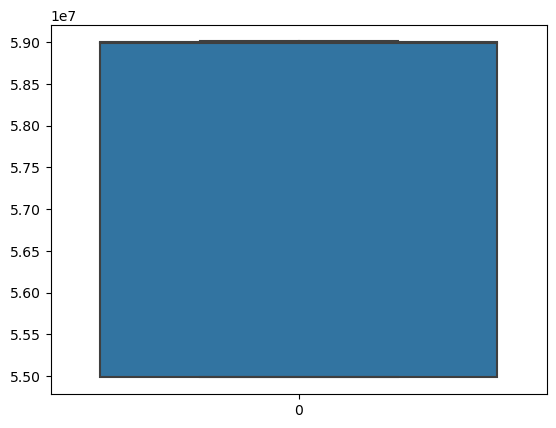

columns: fea_1


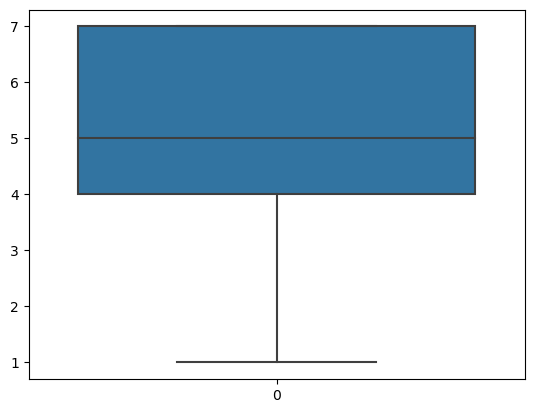

columns: fea_2


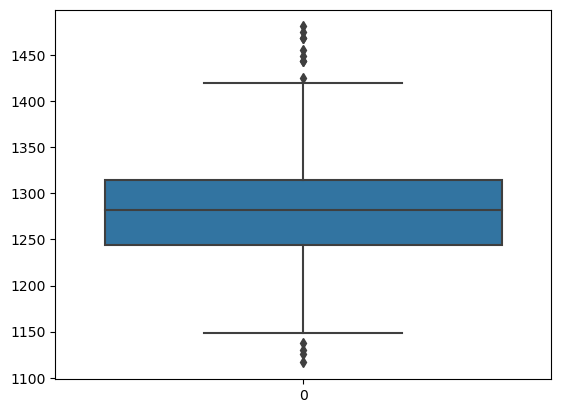

columns: fea_3


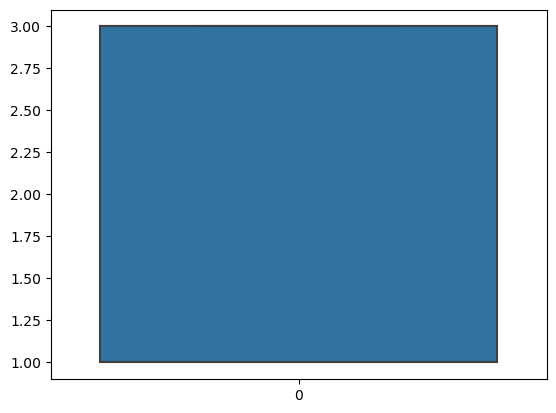

columns: fea_4


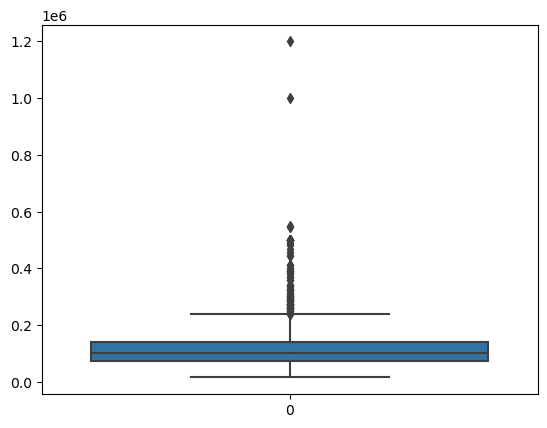

columns: fea_5


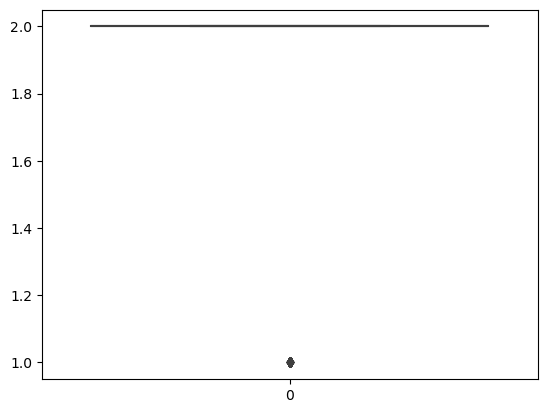

columns: fea_6


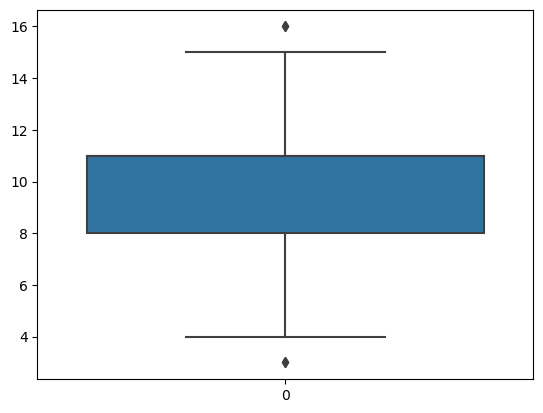

columns: fea_7


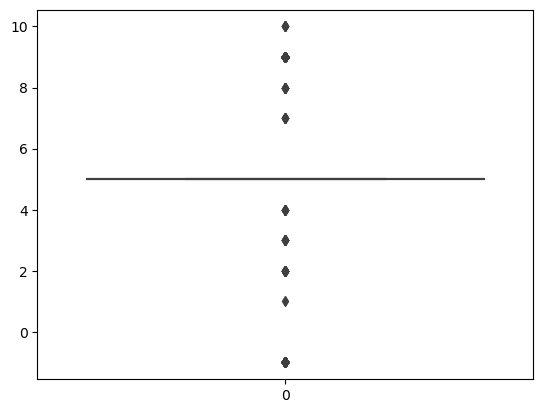

columns: fea_8


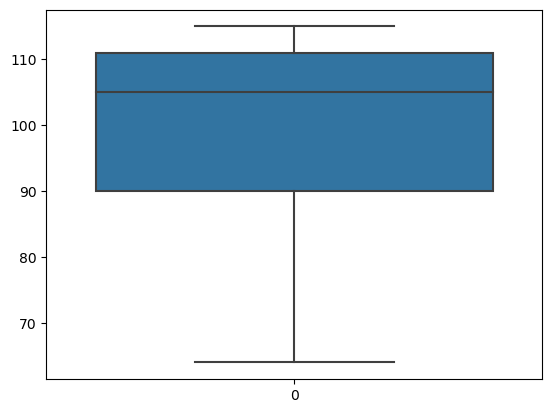

columns: fea_9


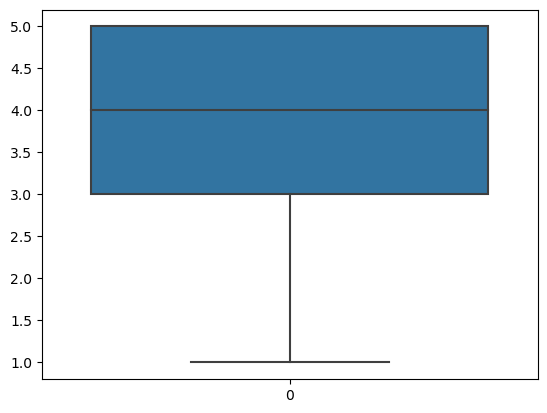

columns: fea_10


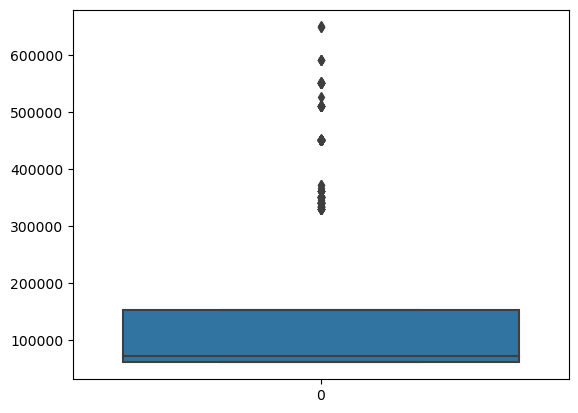

columns: fea_11


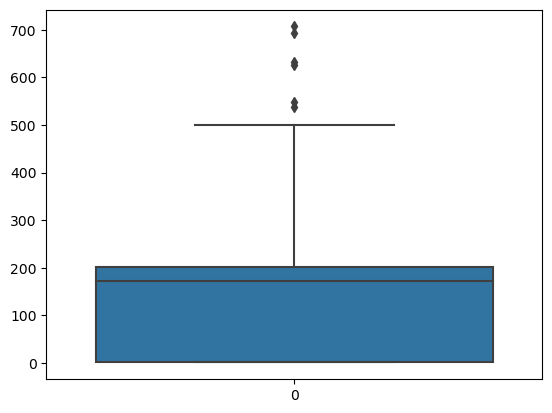

In [9]:
# cheaking for outliers in the dataset
for i in d1.columns:
    print('columns:',i)
    sns.boxplot(d1[i])
    plt.show()

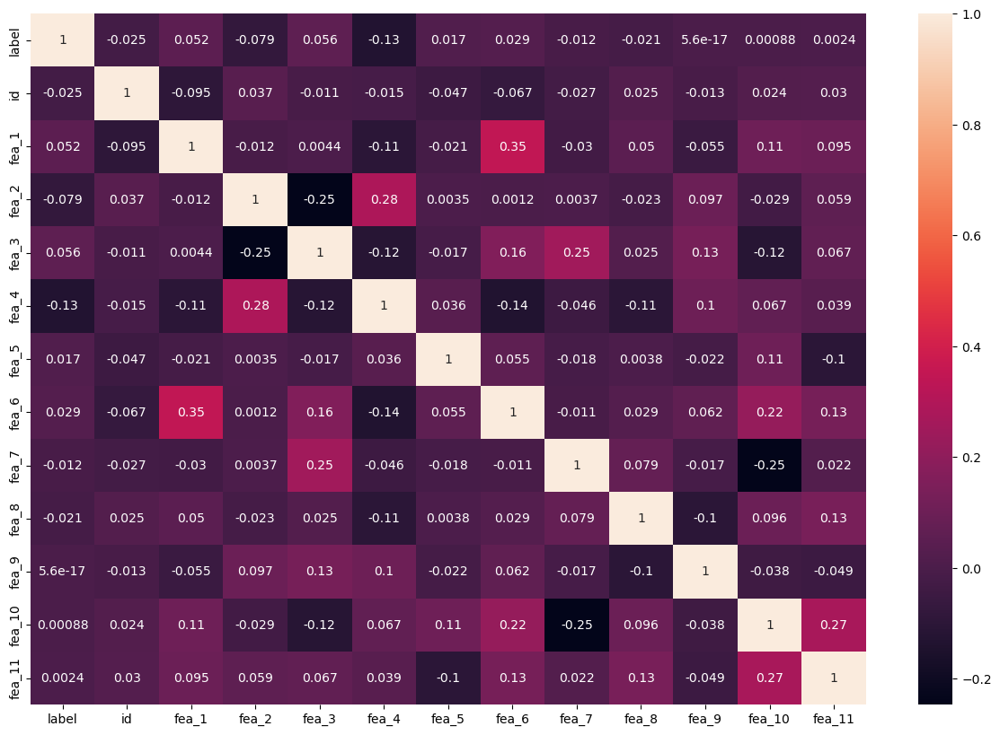

In [10]:
#analyzing the heatmap before imputeing for the null values
plt.figure(figsize=(15,10))
sns.heatmap(d1.corr(),annot= True)
plt.show()

In [11]:
#imputing the null values
impute = KNNImputer(n_neighbors= 3)
d1['fea_2'] = impute.fit_transform(d1[['fea_2']])

In [12]:
d1.isnull().sum() # cheaking the null values after imputing 😎

label     0
id        0
fea_1     0
fea_2     0
fea_3     0
fea_4     0
fea_5     0
fea_6     0
fea_7     0
fea_8     0
fea_9     0
fea_10    0
fea_11    0
dtype: int64

In [13]:
# cheaking the d2 dataset (payments)
d2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8250 entries, 0 to 8249
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               8250 non-null   int64  
 1   OVD_t1           8250 non-null   int64  
 2   OVD_t2           8250 non-null   int64  
 3   OVD_t3           8250 non-null   int64  
 4   OVD_sum          8250 non-null   int64  
 5   pay_normal       8250 non-null   int64  
 6   prod_code        8250 non-null   int64  
 7   prod_limit       2132 non-null   float64
 8   update_date      8224 non-null   object 
 9   new_balance      8250 non-null   float64
 10  highest_balance  7841 non-null   float64
 11  report_date      7136 non-null   object 
dtypes: float64(3), int64(7), object(2)
memory usage: 773.6+ KB


In [14]:
# Changing the'update_date'and 'report_date' column to datetime datatype
d2['update_date']=pd.to_datetime(d2['update_date'])
d2['report_date']=pd.to_datetime(d2['report_date'])

In [15]:
d2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8250 entries, 0 to 8249
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   id               8250 non-null   int64         
 1   OVD_t1           8250 non-null   int64         
 2   OVD_t2           8250 non-null   int64         
 3   OVD_t3           8250 non-null   int64         
 4   OVD_sum          8250 non-null   int64         
 5   pay_normal       8250 non-null   int64         
 6   prod_code        8250 non-null   int64         
 7   prod_limit       2132 non-null   float64       
 8   update_date      8224 non-null   datetime64[ns]
 9   new_balance      8250 non-null   float64       
 10  highest_balance  7841 non-null   float64       
 11  report_date      7136 non-null   datetime64[ns]
dtypes: datetime64[ns](2), float64(3), int64(7)
memory usage: 773.6 KB


In [16]:
d2['update_date'][0]  # We need to extract the year,month and day from this column for further analysis

Timestamp('2016-04-12 00:00:00')

In [17]:
# Feature engineering 👾 🤖 🤓


# Extracting from report_date column

d2['r_year'] = d2['report_date'].dt.year
d2['r_month'] = d2['report_date'].dt.month
d2['r_day'] = d2['report_date'].dt.day

# Extracting from update_date column

d2['u_year'] = d2['update_date'].dt.year
d2['u_month'] = d2['update_date'].dt.month
d2['u_day'] = d2['update_date'].dt.day

In [18]:
d2.isnull().sum()

id                    0
OVD_t1                0
OVD_t2                0
OVD_t3                0
OVD_sum               0
pay_normal            0
prod_code             0
prod_limit         6118
update_date          26
new_balance           0
highest_balance     409
report_date        1114
r_year             1114
r_month            1114
r_day              1114
u_year               26
u_month              26
u_day                26
dtype: int64

In [19]:
#Imputing the d2 dataset (payments)

#imputing for the report_dates
rep_cols = ['r_year','r_month','r_day']
for i in rep_cols:
    d2[i]= impute.fit_transform(d2[[i]])

In [20]:
#imputing for the update_dates
up_cols =  ['u_year','u_month','u_day']
for i in up_cols:
    d2[i]= impute.fit_transform(d2[[i]])


In [21]:
d2.isnull().sum() # populated the nulls from year,month,day as we see no nulls

id                    0
OVD_t1                0
OVD_t2                0
OVD_t3                0
OVD_sum               0
pay_normal            0
prod_code             0
prod_limit         6118
update_date          26
new_balance           0
highest_balance     409
report_date        1114
r_year                0
r_month               0
r_day                 0
u_year                0
u_month               0
u_day                 0
dtype: int64

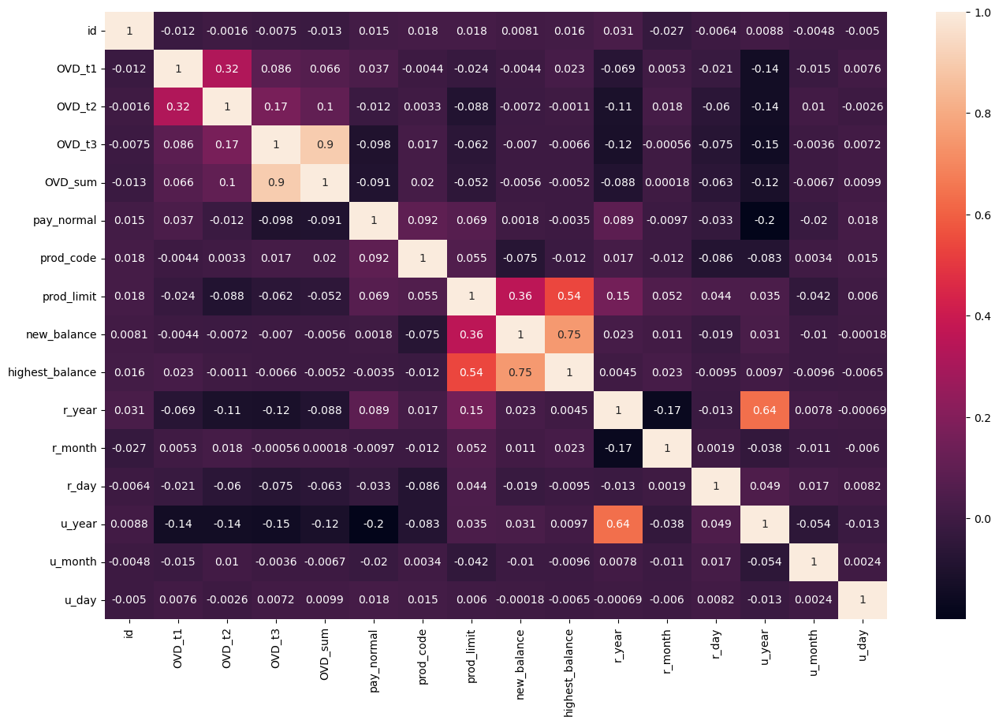

In [22]:
plt.figure(figsize=(16,10))
sns.heatmap(d2.corr(),annot=True)
plt.show()
#we see more brighter colors! means more corelations

In [23]:
d2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8250 entries, 0 to 8249
Data columns (total 18 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   id               8250 non-null   int64         
 1   OVD_t1           8250 non-null   int64         
 2   OVD_t2           8250 non-null   int64         
 3   OVD_t3           8250 non-null   int64         
 4   OVD_sum          8250 non-null   int64         
 5   pay_normal       8250 non-null   int64         
 6   prod_code        8250 non-null   int64         
 7   prod_limit       2132 non-null   float64       
 8   update_date      8224 non-null   datetime64[ns]
 9   new_balance      8250 non-null   float64       
 10  highest_balance  7841 non-null   float64       
 11  report_date      7136 non-null   datetime64[ns]
 12  r_year           8250 non-null   float64       
 13  r_month          8250 non-null   float64       
 14  r_day            8250 non-null   float64

## We will now merge the datasets, and get it ready for ML

In [24]:
merged_df = d1.merge(d2 , on='id')
merged_df.head()

,label,id,fea_1,fea_2,fea_3,fea_4,fea_5,fea_6,fea_7,fea_8,...,update_date,new_balance,highest_balance,report_date,r_year,r_month,r_day,u_year,u_month,u_day
0,1,54982665,5,1245.5,3,77000.0,2,15,5,109,...,2015-01-31,6657.6,18934.0,2015-09-19,2015.000000,9.000000,19.000000,2015.0,1.0,31.0
1,1,54982665,5,1245.5,3,77000.0,2,15,5,109,...,2009-04-28,153792.0,149387.0,2015-10-08,2015.000000,10.000000,8.000000,2009.0,4.0,28.0
2,1,54982665,5,1245.5,3,77000.0,2,15,5,109,...,2009-03-30,0.0,150500.0,NaT,2013.985706,6.241872,17.821469,2009.0,3.0,30.0
3,1,54982665,5,1245.5,3,77000.0,2,15,5,109,...,2007-05-17,0.0,46371.0,2013-12-07,2013.000000,12.000000,7.000000,2007.0,5.0,17.0
4,0,59004779,4,1277.0,1,113000.0,2,8,-1,100,...,2016-02-06,15120.0,21500.0,2016-04-19,2016.000000,4.000000,19.000000,2016.0,2.0,6.0


In [25]:
merged_df.isnull().sum()

label                 0
id                    0
fea_1                 0
fea_2                 0
fea_3                 0
fea_4                 0
fea_5                 0
fea_6                 0
fea_7                 0
fea_8                 0
fea_9                 0
fea_10                0
fea_11                0
OVD_t1                0
OVD_t2                0
OVD_t3                0
OVD_sum               0
pay_normal            0
prod_code             0
prod_limit         6118
update_date          26
new_balance           0
highest_balance     409
report_date        1114
r_year                0
r_month               0
r_day                 0
u_year                0
u_month               0
u_day                 0
dtype: int64

In [26]:
#Imputing the prod_limit,highest_balance
cols = ['prod_limit','highest_balance']
for i in cols:
    merged_df[i]=impute.fit_transform(merged_df[[i]])

In [27]:
merged_df.isnull().sum() #😎

label                 0
id                    0
fea_1                 0
fea_2                 0
fea_3                 0
fea_4                 0
fea_5                 0
fea_6                 0
fea_7                 0
fea_8                 0
fea_9                 0
fea_10                0
fea_11                0
OVD_t1                0
OVD_t2                0
OVD_t3                0
OVD_sum               0
pay_normal            0
prod_code             0
prod_limit            0
update_date          26
new_balance           0
highest_balance       0
report_date        1114
r_year                0
r_month               0
r_day                 0
u_year                0
u_month               0
u_day                 0
dtype: int64

In [28]:
# You might be thinking why I didnt impute update_date and report_date right? 😎
# its because i'm gonna remove them anyways, I should have done this in the feature engineering part!
merged_df.drop(columns=['update_date','report_date'],inplace=True)

In [29]:
x = merged_df[merged_df.columns[2:]]
y = merged_df['label']

In [30]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.2,random_state=11)

In [31]:
from sklearn.ensemble import RandomForestClassifier
classifier  = RandomForestClassifier()

In [32]:
classifier.fit(x_train,y_train)

RandomForestClassifier()

In [33]:
y_pred = classifier.predict(x_test)

In [34]:
from sklearn.metrics import classification_report

In [35]:
print(classification_report(y_test,y_pred),'😎  ❤️') 

              precision    recall  f1-score   support

           0       0.93      1.00      0.96      1379
           1       0.99      0.59      0.74       271

    accuracy                           0.93      1650
   macro avg       0.96      0.80      0.85      1650
weighted avg       0.94      0.93      0.93      1650
 😎  ❤️
